# Synthetic Face Image Generation with Generative Adverserial Networks
https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as du
from torch.utils.data import Dataset
from torchvision import datasets, transforms, models
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import cv2 
import numpy as np
from tqdm import tqdm

## Downloading CelebA Dataset

In [2]:
transform = transforms.Compose([
                                transforms.Resize((64, 64)),
                               transforms.CenterCrop((64,64)),
                               transforms.ToTensor(),
                               transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
                              #  transforms.Normalize([0.506, 0.425, 0.383], [0.304, 0.284, 0.283]),
                            ])
train_data = datasets.ImageFolder("./datasets/celeba", transform=transform)
print("train images", len(train_data))

train images 202599


# Ploting 16 Images from Dataset

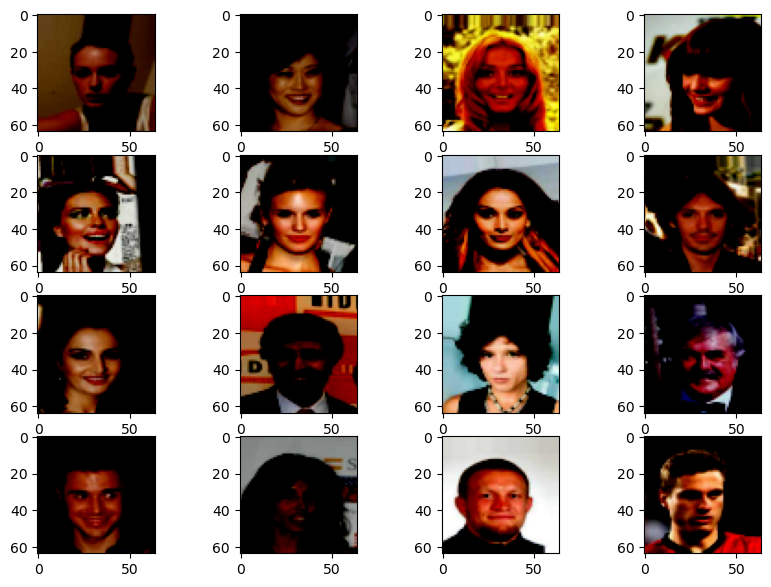

In [3]:
fig = plt.figure(figsize=(10, 7))
load_img = du.DataLoader(dataset=train_data,
                             batch_size=1,
                             shuffle=True)
for i, (img,_) in enumerate(load_img):
    if(i >= 16):
        break
    fig.add_subplot(4, 4, i+1)
    img = torch.einsum("cwh->whc", img[0])
    img[img<0] = 0
    img[img>1] = 1
    plt.imshow(img)

## Generator

In [4]:
class Generator(nn.Module):
    def __init__(self, in_dim, upscale_channels, out_channels):
        
        super(Generator, self).__init__()

        self.model = nn.Sequential(
                        nn.ConvTranspose2d(in_dim, upscale_channels*16, 4, 1, 0, bias=False),
                        nn.BatchNorm2d(upscale_channels*16),
                        nn.ReLU(),
                        nn.ConvTranspose2d(upscale_channels*16, upscale_channels*8, 4, 2, 1, bias=False),
                        nn.BatchNorm2d(upscale_channels*8),
                        nn.ReLU(),
                        nn.ConvTranspose2d(upscale_channels*8, upscale_channels*4, 4, 2, 1, bias=False),
                        nn.BatchNorm2d(upscale_channels*4),
                        nn.ReLU(),
                        nn.ConvTranspose2d(upscale_channels*4, upscale_channels*2, 4, 2, 1, bias=False),
                        nn.BatchNorm2d(upscale_channels*2),
                        nn.ReLU(),
                        nn.ConvTranspose2d(upscale_channels*2, out_channels, 4, 2, 1, bias=False),
                        nn.Tanh(),
                     )

    def forward(self, x):
        return self.model(x)

## Discriminator

In [5]:
class Discriminator(nn.Module):
    def __init__(self, in_channels, features):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
                        nn.Conv2d(in_channels, features, 4, 2, 1, bias=False),
                        nn.LeakyReLU(negative_slope=.2),
                        nn.Conv2d(features, features*2, 4, 2, 1, bias=False),
                        nn.BatchNorm2d(features*2),
                        nn.LeakyReLU(negative_slope=.2),
                        nn.Conv2d(features*2, features*4, 4, 2, 1, bias=False),
                        nn.BatchNorm2d(features*4),
                        nn.LeakyReLU(negative_slope=.2),
                        nn.Conv2d(features*4, features*8, 4, 2, 1, bias=False),
                        nn.BatchNorm2d(features*8),
                        nn.LeakyReLU(negative_slope=.2),
                        nn.Conv2d(features*8, 1, 4, 1, 0, bias=False),
                        nn.Sigmoid()
                     )

    def forward(self, x):
        return self.model(x)
        

## Initializing Weights

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Initializing Model

In [7]:
device = f'cuda:0' if torch.cuda.is_available() else 'cpu'
print(f"using device: {device}")
batch_size = 128
gen_learning_rate = 2e-4
disc_learning_rate = 2e-4
epochs = 5
in_dim = 100
out_channels = 3
upscale_channels = 64
noise_dim = in_dim
features = 64


gen = Generator(in_dim, upscale_channels, out_channels)
disc = Discriminator(out_channels, features)

gen_optimizer = optim.Adam(gen.parameters(), lr=gen_learning_rate, betas=(0.5, .999))
disc_optimizer = optim.Adam(disc.parameters(), lr=disc_learning_rate, betas=(0.5, .999))

# load training data in batches
train_loader = du.DataLoader(dataset=train_data,
                             batch_size=batch_size,
                             shuffle=True)
# send model over to device
gen = gen.to(device)
disc = disc.to(device)
gen.apply(weights_init)
disc.apply(weights_init)
gen.train()
disc.train()

using device: cuda:0


Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Training Model

100%|██████████| 1583/1583 [36:30<00:00,  1.38s/it]


Epoch: 1, Generator Loss: 0.027195, Discriminator Loss: 0.007723


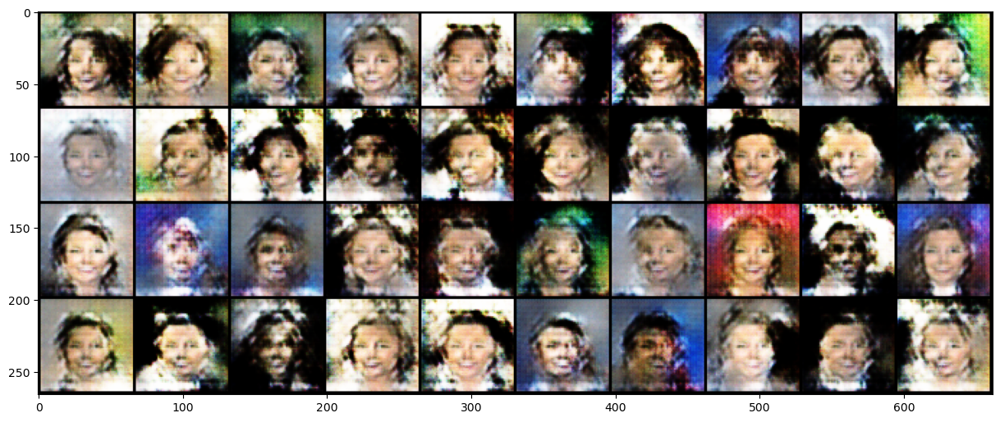

100%|██████████| 1583/1583 [24:45<00:00,  1.07it/s]


Epoch: 2, Generator Loss: 0.020252, Discriminator Loss: 0.007030


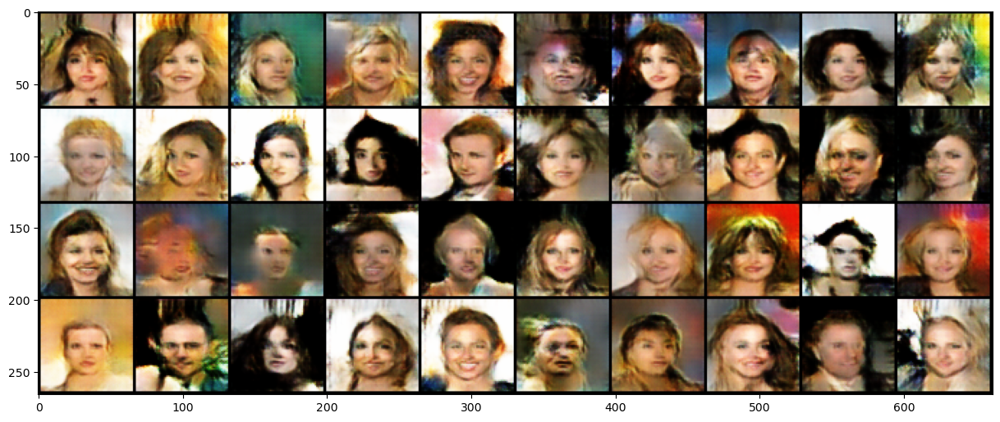

100%|██████████| 1583/1583 [17:46<00:00,  1.48it/s]


Epoch: 3, Generator Loss: 0.015121, Discriminator Loss: 0.007881


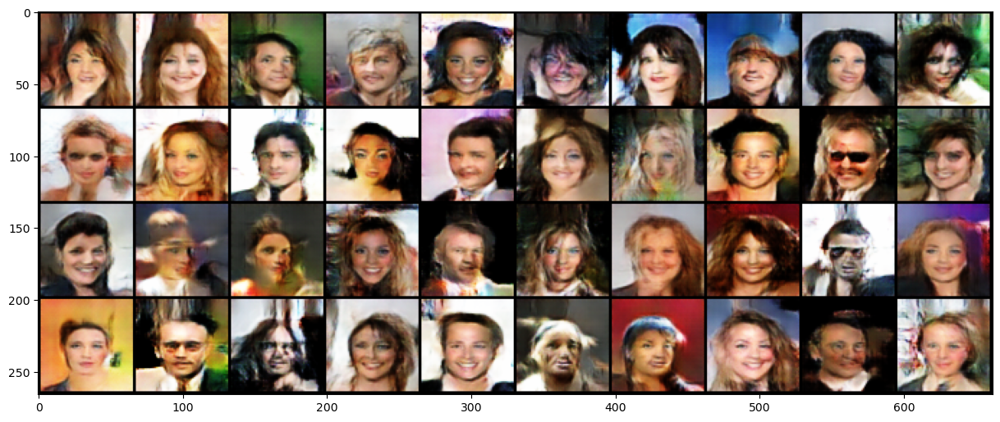

100%|██████████| 1583/1583 [29:17<00:00,  1.11s/it] 


Epoch: 4, Generator Loss: 0.013815, Discriminator Loss: 0.008361


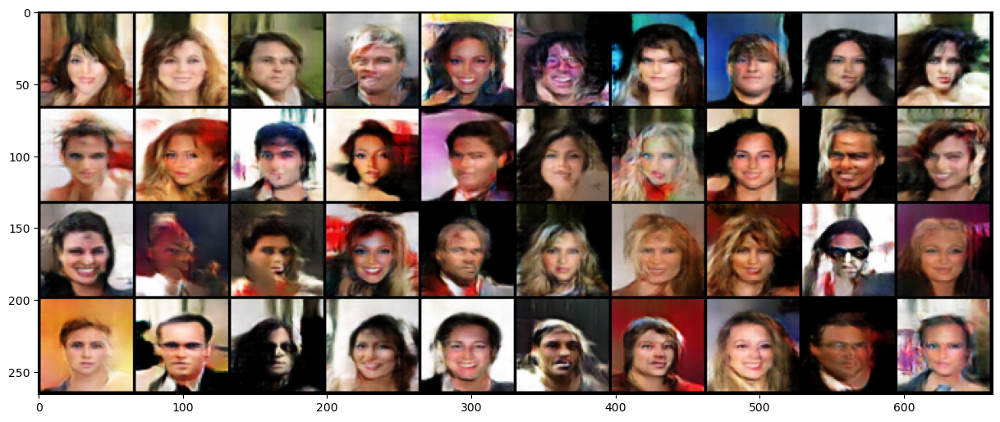

100%|██████████| 1583/1583 [32:54<00:00,  1.25s/it]  


Epoch: 5, Generator Loss: 0.013752, Discriminator Loss: 0.008192


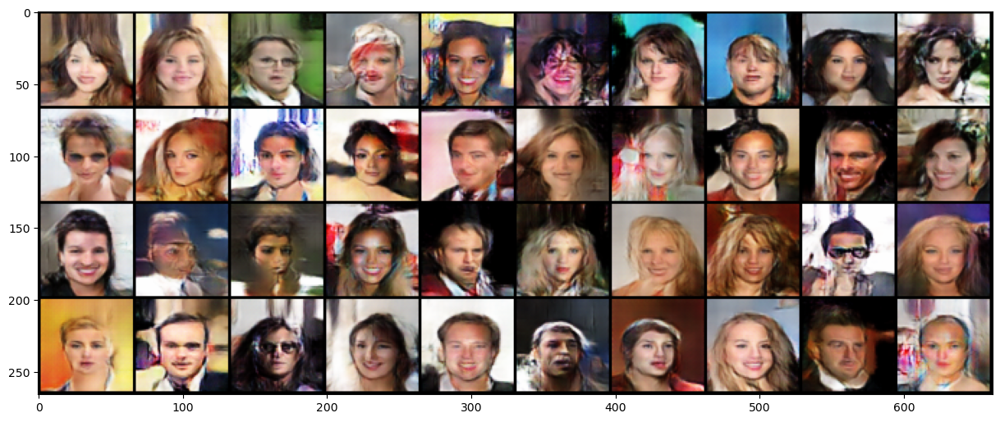

In [8]:
height = 4
width = 10
gen_loss_list = []
disc_loss_list = []
validation_noise = torch.randn(height*width, noise_dim, 1, 1, device=device)
for epoch in range(1, epochs + 1):    
    sum_gen_loss = 0.
    sum_disc_loss = 0.
    gen.train()
    disc.train()
    for batch_idx, (data, _) in enumerate(tqdm(train_loader)):
        data = data.to(device)
        ones = torch.ones(data.shape[0]).to(device)
        zeros = torch.zeros(data.shape[0]).to(device)
        ones = torch.ones(data.shape[0]).to(device)
        zeros = torch.zeros(data.shape[0]).to(device)

        # training discriminator
        disc_optimizer.zero_grad()
        noise = torch.randn(data.shape[0], noise_dim, 1, 1, device=device) #use randn instead of rand to generate a standard normal distribution rather than a uniform distribution
        fakes = gen(noise)
        pred_fakes = disc(fakes.detach()).view(-1)
        pred_real = disc(data).view(-1)
        disc_fake_loss = F.binary_cross_entropy(pred_fakes, zeros)
        disc_real_loss = F.binary_cross_entropy(pred_real, ones)
        disc_loss = disc_fake_loss + disc_real_loss
        sum_disc_loss += disc_loss.item()
        disc_loss_list.append(disc_loss.item())
        disc_loss.backward()
        disc_optimizer.step()

        # training generator
        gen_optimizer.zero_grad()
        pred_fakes = disc(fakes).view(-1)
        gen_loss = F.binary_cross_entropy(pred_fakes, ones)
        sum_gen_loss += gen_loss.item()
        gen_loss_list.append(gen_loss.item())
        gen_loss.backward()
        gen_optimizer.step()

    sum_gen_loss /= len(train_loader.dataset)
    sum_disc_loss /= len(train_loader.dataset)

    print(f'Epoch: {epoch}, Generator Loss: {sum_gen_loss:.6f}, Discriminator Loss: {sum_disc_loss:.6f}')
    with torch.no_grad():
        gen.eval()
        '''
        Testing model by generating a bunch of synthetic images on random noise 
        '''
        synth_img = vutils.make_grid(gen(validation_noise), nrow=width, hcol=height, padding=2, normalize=True).detach().cpu()
        fig = plt.figure(figsize=(15,15))
        plt.imshow(torch.einsum("cwh->whc", synth_img))
    plt.show()

## Testing Model On New Noise

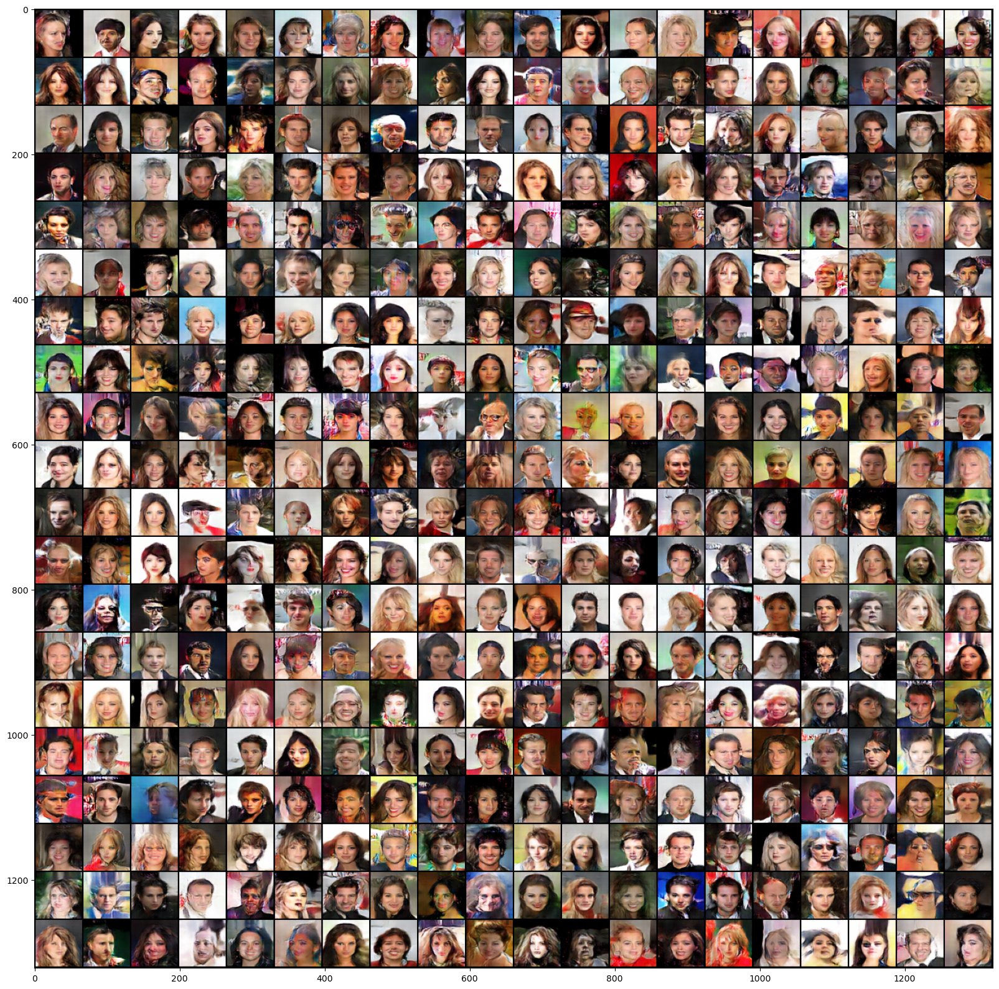

In [9]:
'''
Testing model by generating a bunch of synthetic images on random noise 
'''
height = 20 
width = 20
test_noise = torch.randn(height*width, noise_dim, 1, 1, device=device)
synth_img = vutils.make_grid(gen(test_noise), nrow=width, hcol=height, padding=2, normalize=True).detach().cpu()
fig = plt.figure(figsize=(20,20))
plt.imshow(torch.einsum("cwh->whc", synth_img))

## Ploting Loss Curve for generator and discriminator 

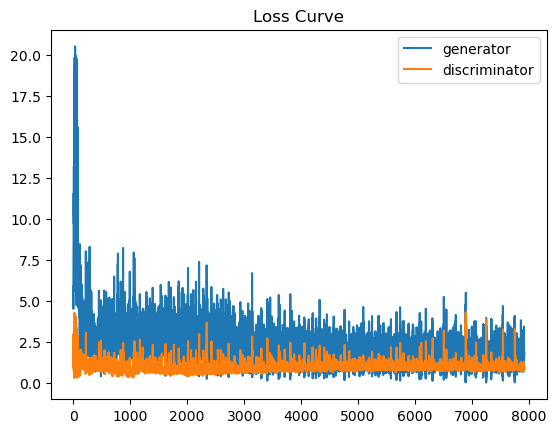

In [10]:
plt.title("Loss Curve")
plt.plot(gen_loss_list, label="generator")
plt.plot(disc_loss_list, label="discriminator")
plt.legend()
plt.show()